## Uncovering Crime Patterns in Communities: A Data-Driven Approach for US Police Dept.  

## 1) Objective Definition:
   
<br>

<b>The crime dataset we have selected contains authentic real-world data, and it has been obtained from the UCI Machine Learning repository. The dataset is titled 'Crime and Communities', which suggests that it includes information on crime and related factors in various communities.</b>

<b>The dataset is acquired from:</b> https://archive.ics.uci.edu/ml/machine-learning-databases/communities/
    

## 2) Data Collection and Importing the Data

In [36]:
# importing processing effeciency (numpy)
# importing data manipulation and analysis library (Pandas)
import pandas as pd
import numpy as np

In [37]:
# importing warnings library to temporarily suppress warnings that may be displayed when running the code
import warnings
warnings.filterwarnings('ignore')

In [38]:
# Reading communities.names file to extract columns name for data
column_list = []
with open('communities.names') as file:
    lines = file.readlines()
    specific_lines = [lines[i] for i in range(75, 203)]
    for string in specific_lines:
        column_list.append(string.split()[1])
    print(column_list)

['state', 'county', 'community', 'communityname', 'fold', 'population', 'householdsize', 'racepctblack', 'racePctWhite', 'racePctAsian', 'racePctHisp', 'agePct12t21', 'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban', 'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad', 'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu', 'PctEmplProfServ', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'TotalPctDiv', 'PersPerFam', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRecent', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10', 'PctRecentImmig', 'PctRecImmig5', 'PctRecImmig8', 'PctRecImmig10', 'PctSpeakEnglOn

In [39]:
# Reading communities.data file to extract data of community
with open('communities.data') as f:
    data = f.readlines()
communities_crimes_df = pd.DataFrame(data, columns=['data'])
communities_crimes_df = communities_crimes_df['data'].str.split(',', expand=True)
communities_crimes_df

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,8,?,?,Lakewoodcity,1,0.19,0.33,0.02,0.9,0.12,...,0.12,0.26,0.2,0.06,0.04,0.9,0.5,0.32,0.14,0.2\n
1,53,?,?,Tukwilacity,1,0,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,?,?,?,?,0,?,0.67\n
2,24,?,?,Aberdeentown,1,0,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,?,?,?,?,0,?,0.43\n
3,34,5,81440,Willingborotownship,1,0.04,0.77,1,0.08,0.12,...,0.02,0.39,0.28,?,?,?,?,0,?,0.12\n
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,?,?,?,?,0,?,0.03\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,?,?,TempleTerracecity,10,0.01,0.4,0.1,0.87,0.12,...,0.01,0.28,0.05,?,?,?,?,0,?,0.09\n
1990,6,?,?,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.2,?,?,?,?,0,?,0.45\n
1991,9,9,80070,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0,0.91,0.28,0.23\n
1992,25,17,72600,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0,0.22,0.18,0.19\n


## 3) Data Cleaning and Wrangling 

In [40]:
# Replacing all occurrences of the string '?' in a DataFrame df with the NumPy NaN
communities_crimes_df = communities_crimes_df.replace('?', np.nan)
communities_crimes_df

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.9,0.12,...,0.12,0.26,0.2,0.06,0.04,0.9,0.5,0.32,0.14,0.2\n
1,53,NaN,NaN,Tukwilacity,1,0,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0,NaN,0.67\n
2,24,NaN,NaN,Aberdeentown,1,0,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0,NaN,0.43\n
3,34,5,81440,Willingborotownship,1,0.04,0.77,1,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0,NaN,0.12\n
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0,NaN,0.03\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.4,0.1,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0,NaN,0.09\n
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.2,NaN,NaN,NaN,NaN,0,NaN,0.45\n
1991,9,9,80070,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0,0.91,0.28,0.23\n
1992,25,17,72600,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0,0.22,0.18,0.19\n


In [41]:
## extracting the column_list from communities.name and assigning to communities_crimes_df dataframe
communities_crimes_df.columns = column_list
communities_crimes_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.9,0.12,...,0.12,0.26,0.2,0.06,0.04,0.9,0.5,0.32,0.14,0.2\n
1,53,NaN,NaN,Tukwilacity,1,0,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0,NaN,0.67\n
2,24,NaN,NaN,Aberdeentown,1,0,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0,NaN,0.43\n
3,34,5,81440,Willingborotownship,1,0.04,0.77,1,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0,NaN,0.12\n
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0,NaN,0.03\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.4,0.1,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0,NaN,0.09\n
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.2,NaN,NaN,NaN,NaN,0,NaN,0.45\n
1991,9,9,80070,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0,0.91,0.28,0.23\n
1992,25,17,72600,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0,0.22,0.18,0.19\n


In [42]:
## Checking the size of dataframe
communities_crimes_df.shape

(1994, 128)

In [43]:
## Checking the number of communities in the dataframe
len(communities_crimes_df['communityname'].unique())

1828

In [44]:
## checking the number of missing values in each column
for column in communities_crimes_df.columns:
    print(column + ': ' +str(communities_crimes_df[column].isna().sum()))

state: 0
county: 1174
community: 1177
communityname: 0
fold: 0
population: 0
householdsize: 0
racepctblack: 0
racePctWhite: 0
racePctAsian: 0
racePctHisp: 0
agePct12t21: 0
agePct12t29: 0
agePct16t24: 0
agePct65up: 0
numbUrban: 0
pctUrban: 0
medIncome: 0
pctWWage: 0
pctWFarmSelf: 0
pctWInvInc: 0
pctWSocSec: 0
pctWPubAsst: 0
pctWRetire: 0
medFamInc: 0
perCapInc: 0
whitePerCap: 0
blackPerCap: 0
indianPerCap: 0
AsianPerCap: 0
OtherPerCap: 1
HispPerCap: 0
NumUnderPov: 0
PctPopUnderPov: 0
PctLess9thGrade: 0
PctNotHSGrad: 0
PctBSorMore: 0
PctUnemployed: 0
PctEmploy: 0
PctEmplManu: 0
PctEmplProfServ: 0
PctOccupManu: 0
PctOccupMgmtProf: 0
MalePctDivorce: 0
MalePctNevMarr: 0
FemalePctDiv: 0
TotalPctDiv: 0
PersPerFam: 0
PctFam2Par: 0
PctKids2Par: 0
PctYoungKids2Par: 0
PctTeen2Par: 0
PctWorkMomYoungKids: 0
PctWorkMom: 0
NumIlleg: 0
PctIlleg: 0
NumImmig: 0
PctImmigRecent: 0
PctImmigRec5: 0
PctImmigRec8: 0
PctImmigRec10: 0
PctRecentImmig: 0
PctRecImmig5: 0
PctRecImmig8: 0
PctRecImmig10: 0
PctSpeakEn

In [45]:
## checking the dtype of each column
for column in communities_crimes_df.columns:
    print(column + ': ' +str(communities_crimes_df[column].dtype))

state: object
county: object
community: object
communityname: object
fold: object
population: object
householdsize: object
racepctblack: object
racePctWhite: object
racePctAsian: object
racePctHisp: object
agePct12t21: object
agePct12t29: object
agePct16t24: object
agePct65up: object
numbUrban: object
pctUrban: object
medIncome: object
pctWWage: object
pctWFarmSelf: object
pctWInvInc: object
pctWSocSec: object
pctWPubAsst: object
pctWRetire: object
medFamInc: object
perCapInc: object
whitePerCap: object
blackPerCap: object
indianPerCap: object
AsianPerCap: object
OtherPerCap: object
HispPerCap: object
NumUnderPov: object
PctPopUnderPov: object
PctLess9thGrade: object
PctNotHSGrad: object
PctBSorMore: object
PctUnemployed: object
PctEmploy: object
PctEmplManu: object
PctEmplProfServ: object
PctOccupManu: object
PctOccupMgmtProf: object
MalePctDivorce: object
MalePctNevMarr: object
FemalePctDiv: object
TotalPctDiv: object
PersPerFam: object
PctFam2Par: object
PctKids2Par: object
PctYoung

### Handling Missing Values in the Dataframe

<b>We are removing the "county" and "community" columns from the dataframe because they cannot be handled when dealing with missing values. However, this will not impact the analysis as we still have the community names for each state. Therefore, the analysis can still be carried out without compromising the integrity of the data.</b>

In [46]:
## removing county and community columns from the dataframe
communities_crimes_df = communities_crimes_df.drop(columns=['county',
                          'community'], axis=1)
communities_crimes_df.head()

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,Lakewoodcity,1,0.19,0.33,0.02,0.9,0.12,0.17,0.34,...,0.12,0.26,0.2,0.06,0.04,0.9,0.5,0.32,0.14,0.2\n
1,53,Tukwilacity,1,0,0.16,0.12,0.74,0.45,0.07,0.26,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0,NaN,0.67\n
2,24,Aberdeentown,1,0,0.42,0.49,0.56,0.17,0.04,0.39,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0,NaN,0.43\n
3,34,Willingborotownship,1,0.04,0.77,1,0.08,0.12,0.1,0.51,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0,NaN,0.12\n
4,42,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0,NaN,0.03\n


<b> In order to ensure accurate and reliable analysis, we decided to remove many different attributes from the dataframe that have missing values exceeding 1500 out of 2000 rows. With such a large number of missing values, it was impossible to handle these variables effectively. However, we determined that removing these columns would not have an impact on the analysis as there are still many other predictor variables available.</b>

In [47]:
## Generating a custom function to deal with copious amount of missing values columns
def columns_drop(communities_crimes_df):
    column_to_drop=[]
    for col in communities_crimes_df.columns:
        if communities_crimes_df[col].isna().sum() > 1500:
            column_to_drop.append(col)
    communities_crimes_df.drop(column_to_drop, axis=1, inplace=True)
    print(column_to_drop)
    return communities_crimes_df

In [48]:
communities_crimes_df = columns_drop(communities_crimes_df)

['LemasSwornFT', 'LemasSwFTPerPop', 'LemasSwFTFieldOps', 'LemasSwFTFieldPerPop', 'LemasTotalReq', 'LemasTotReqPerPop', 'PolicReqPerOffic', 'PolicPerPop', 'RacialMatchCommPol', 'PctPolicWhite', 'PctPolicBlack', 'PctPolicHisp', 'PctPolicAsian', 'PctPolicMinor', 'OfficAssgnDrugUnits', 'NumKindsDrugsSeiz', 'PolicAveOTWorked', 'PolicCars', 'PolicOperBudg', 'LemasPctPolicOnPatr', 'LemasGangUnitDeploy', 'PolicBudgPerPop']


In [49]:
## Checking the size of the dataframe again
communities_crimes_df.shape

(1994, 104)

In [50]:
## checking again the number of missing values in each column to see the execution of above code
for column in communities_crimes_df.columns:
    print(column + ': ' +str(communities_crimes_df[column].isna().sum()))

state: 0
communityname: 0
fold: 0
population: 0
householdsize: 0
racepctblack: 0
racePctWhite: 0
racePctAsian: 0
racePctHisp: 0
agePct12t21: 0
agePct12t29: 0
agePct16t24: 0
agePct65up: 0
numbUrban: 0
pctUrban: 0
medIncome: 0
pctWWage: 0
pctWFarmSelf: 0
pctWInvInc: 0
pctWSocSec: 0
pctWPubAsst: 0
pctWRetire: 0
medFamInc: 0
perCapInc: 0
whitePerCap: 0
blackPerCap: 0
indianPerCap: 0
AsianPerCap: 0
OtherPerCap: 1
HispPerCap: 0
NumUnderPov: 0
PctPopUnderPov: 0
PctLess9thGrade: 0
PctNotHSGrad: 0
PctBSorMore: 0
PctUnemployed: 0
PctEmploy: 0
PctEmplManu: 0
PctEmplProfServ: 0
PctOccupManu: 0
PctOccupMgmtProf: 0
MalePctDivorce: 0
MalePctNevMarr: 0
FemalePctDiv: 0
TotalPctDiv: 0
PersPerFam: 0
PctFam2Par: 0
PctKids2Par: 0
PctYoungKids2Par: 0
PctTeen2Par: 0
PctWorkMomYoungKids: 0
PctWorkMom: 0
NumIlleg: 0
PctIlleg: 0
NumImmig: 0
PctImmigRecent: 0
PctImmigRec5: 0
PctImmigRec8: 0
PctImmigRec10: 0
PctRecentImmig: 0
PctRecImmig5: 0
PctRecImmig8: 0
PctRecImmig10: 0
PctSpeakEnglOnly: 0
PctNotSpeakEnglWell

<b>As there is only one missing value in a [OtherPerCap] column across all the records, we have decided to impute it with the mean value rather than dropping the entire column. This approach will ensure that we retain valuable information and avoid losing potentially useful data.</b>

In [51]:
# Using imputation techniques to fill the missing values with mean of the column

from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')
imputer.fit(communities_crimes_df[['OtherPerCap']])
communities_crimes_df[['OtherPerCap']] = imputer.transform(communities_crimes_df[['OtherPerCap']])

In [52]:
communities_crimes_df

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,...,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop
0,8,Lakewoodcity,1,0.19,0.33,0.02,0.9,0.12,0.17,0.34,...,0.12,0.42,0.5,0.51,0.64,0.12,0.26,0.2,0.32,0.2\n
1,53,Tukwilacity,1,0,0.16,0.12,0.74,0.45,0.07,0.26,...,0.21,0.5,0.34,0.6,0.52,0.02,0.12,0.45,0,0.67\n
2,24,Aberdeentown,1,0,0.42,0.49,0.56,0.17,0.04,0.39,...,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0,0.43\n
3,34,Willingborotownship,1,0.04,0.77,1,0.08,0.12,0.1,0.51,...,0.19,0.3,0.73,0.64,0.65,0.02,0.39,0.28,0,0.12\n
4,42,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,...,0.11,0.72,0.64,0.61,0.53,0.04,0.09,0.02,0,0.03\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,TempleTerracecity,10,0.01,0.4,0.1,0.87,0.12,0.16,0.43,...,0.22,0.28,0.34,0.48,0.39,0.01,0.28,0.05,0,0.09\n
1990,6,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,0.32,0.69,...,0.53,0.25,0.17,0.1,0,0.02,0.37,0.2,0,0.45\n
1991,9,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,0.25,0.35,...,0.25,0.68,0.61,0.79,0.76,0.08,0.32,0.18,0.91,0.23\n
1992,25,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,0.1,0.58,...,0.45,0.64,0.54,0.59,0.52,0.03,0.38,0.33,0.22,0.19\n


### Handling Dtype of all the columns of DataFrame

In [53]:
for column in communities_crimes_df.columns:
    print(column + ': ' +str(communities_crimes_df[column].dtype))

state: object
communityname: object
fold: object
population: object
householdsize: object
racepctblack: object
racePctWhite: object
racePctAsian: object
racePctHisp: object
agePct12t21: object
agePct12t29: object
agePct16t24: object
agePct65up: object
numbUrban: object
pctUrban: object
medIncome: object
pctWWage: object
pctWFarmSelf: object
pctWInvInc: object
pctWSocSec: object
pctWPubAsst: object
pctWRetire: object
medFamInc: object
perCapInc: object
whitePerCap: object
blackPerCap: object
indianPerCap: object
AsianPerCap: object
OtherPerCap: float64
HispPerCap: object
NumUnderPov: object
PctPopUnderPov: object
PctLess9thGrade: object
PctNotHSGrad: object
PctBSorMore: object
PctUnemployed: object
PctEmploy: object
PctEmplManu: object
PctEmplProfServ: object
PctOccupManu: object
PctOccupMgmtProf: object
MalePctDivorce: object
MalePctNevMarr: object
FemalePctDiv: object
TotalPctDiv: object
PersPerFam: object
PctFam2Par: object
PctKids2Par: object
PctYoungKids2Par: object
PctTeen2Par: ob

In [54]:
## Converting the unmatched dtypes to the relevant dtypes for better analysis

for column in communities_crimes_df.columns:
    if column=='communityname' :
        communities_crimes_df[column] = communities_crimes_df[column].astype(str)
    elif column=='state':
        communities_crimes_df[column] = communities_crimes_df[column].astype(int)
    else:
        communities_crimes_df[column] = communities_crimes_df[column].astype(float)

In [55]:
## ## checking again the dtype of each column for the execution of above code
for column in communities_crimes_df.columns:
    print(column + ': ' +str(communities_crimes_df[column].dtype))

state: int32
communityname: object
fold: float64
population: float64
householdsize: float64
racepctblack: float64
racePctWhite: float64
racePctAsian: float64
racePctHisp: float64
agePct12t21: float64
agePct12t29: float64
agePct16t24: float64
agePct65up: float64
numbUrban: float64
pctUrban: float64
medIncome: float64
pctWWage: float64
pctWFarmSelf: float64
pctWInvInc: float64
pctWSocSec: float64
pctWPubAsst: float64
pctWRetire: float64
medFamInc: float64
perCapInc: float64
whitePerCap: float64
blackPerCap: float64
indianPerCap: float64
AsianPerCap: float64
OtherPerCap: float64
HispPerCap: float64
NumUnderPov: float64
PctPopUnderPov: float64
PctLess9thGrade: float64
PctNotHSGrad: float64
PctBSorMore: float64
PctUnemployed: float64
PctEmploy: float64
PctEmplManu: float64
PctEmplProfServ: float64
PctOccupManu: float64
PctOccupMgmtProf: float64
MalePctDivorce: float64
MalePctNevMarr: float64
FemalePctDiv: float64
TotalPctDiv: float64
PersPerFam: float64
PctFam2Par: float64
PctKids2Par: floa

## As part of our analysis, we decided to map the state integer column into state names to make the data more interpretable. We created a mapping between the state integers and their respective state names, and also added the two extra columns for latitude and longitude to provide better geographic context. By doing this,  it will enable us to identify any geographic trends or patterns that may exist in our data, and make more informed decisions based on the insights gained.

In [56]:
## mapping of state in integer values into state names 
state_codes = {1: 'AL', 2: 'AK', 4: 'AZ', 5: 'AR', 6: 'CA', 8: 'CO', 9: 'CT', 10: 'DE', 11: 'DC', 12: 'FL', 13: 'GA', 15: 'HI', 16: 'ID', 17: 'IL', 18: 'IN', 19: 'IA', 20: 'KS', 21: 'KY', 22: 'LA', 23: 'ME', 24: 'MD', 25: 'MA', 26: 'MI', 27: 'MN', 28: 'MS', 29: 'MO', 30: 'MT', 31: 'NE', 32: 'NV', 33: 'NH', 34: 'NJ', 35: 'NM', 36: 'NY', 37: 'NC', 38: 'ND', 39: 'OH', 40: 'OK', 41: 'OR', 42: 'PA', 44: 'RI', 45: 'SC', 46: 'SD', 47: 'TN', 48: 'TX', 49: 'UT', 50: 'VT', 51: 'VA', 53: 'WA', 54: 'WV', 55: 'WI', 56: 'WY'}
communities_crimes_df['state']=communities_crimes_df['state'].map(state_codes)

In [57]:
#pip install uszipcode

In [58]:
from uszipcode import SearchEngine

In [59]:
# Initialize the uszipcode search engine
search = SearchEngine()

# Defining a function to get the latitude and longitude for a given state code
def get_lat_long(state_code):
    try:
        result = search.by_state(state_code)[0]
        return result.lat, result.lng
    except:
        return None, None

communities_crimes_df[['latitude', 'longitude']] = communities_crimes_df['state'].apply(lambda x: pd.Series(get_lat_long(x)))

In [60]:
## Checking the final data of communities
communities_crimes_df.head(10)

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,...,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop,latitude,longitude
0,CO,Lakewoodcity,1.0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,...,0.50,0.51,0.64,0.12,0.26,0.20,0.32,0.20,39.79,-105.11
1,WA,Tukwilacity,1.0,0.00,0.16,0.12,0.74,0.45,0.07,0.26,...,0.34,0.60,0.52,0.02,0.12,0.45,0.00,0.67,47.30,-122.26
2,MD,Aberdeentown,1.0,0.00,0.42,0.49,0.56,0.17,0.04,0.39,...,0.54,0.67,0.56,0.01,0.21,0.02,0.00,0.43,38.64,-76.90
3,NJ,Willingborotownship,1.0,0.04,0.77,1.00,0.08,0.12,0.10,0.51,...,0.73,0.64,0.65,0.02,0.39,0.28,0.00,0.12,40.58,-74.27
4,PA,Bethlehemtownship,1.0,0.01,0.55,0.02,0.95,0.09,0.05,0.38,...,0.64,0.61,0.53,0.04,0.09,0.02,0.00,0.03,40.61,-80.25
5,CA,SouthPasadenacity,1.0,0.02,0.28,0.06,0.54,1.00,0.25,0.31,...,0.49,0.73,0.64,0.01,0.58,0.10,0.00,0.14,33.97,-118.24
6,RI,Lincolntown,1.0,0.01,0.39,0.00,0.98,0.06,0.02,0.30,...,0.77,0.91,0.84,0.05,0.08,0.06,0.00,0.03,41.42,-71.78
7,CA,Selmacity,1.0,0.01,0.74,0.03,0.46,0.20,1.00,0.52,...,0.52,0.79,0.78,0.01,0.33,0.00,0.00,0.55,33.97,-118.24
8,KY,Hendersoncity,1.0,0.03,0.34,0.20,0.84,0.02,0.00,0.38,...,0.48,0.79,0.75,0.04,0.17,0.04,0.00,0.53,38.26,-85.05
9,MO,Claytoncity,1.0,0.01,0.40,0.06,0.87,0.30,0.03,0.90,...,0.34,0.23,0.09,0.00,0.47,0.11,0.00,0.15,38.65,-90.58


## 4) Data Exploration

### In order to better understand the data and identify any hidden patterns, we created different sub-samples of the dataframe. These sub-samples allowed us to analyze the data from different perspectives, and visualize the relationships between variables. By doing this, we gained valuable insights into the structure and trends present in the data. [ Note! Only for Understanding and Visualizing ]

## [ First Subsample for Population ]

In [61]:
## First Subsample for Population
## Dataset slicing for Population 

population_attributes = pd.DataFrame()
population_attributes[['population','householdsize', 'pct_blackrace', 'pct_Whiterace', 'pct_Asianrace', 'pct_Hisprace', 'pct_age_12to21', 'pct_age_12to29', 'pct_age_16to24', 'pct_age_65up']] = communities_crimes_df.iloc[:,3:13]
population_attributes.head(10)

,population,householdsize,pct_blackrace,pct_Whiterace,pct_Asianrace,pct_Hisprace,pct_age_12to21,pct_age_12to29,pct_age_16to24,pct_age_65up
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36
5,0.02,0.28,0.06,0.54,1.00,0.25,0.31,0.48,0.27,0.37
6,0.01,0.39,0.00,0.98,0.06,0.02,0.30,0.37,0.23,0.60
7,0.01,0.74,0.03,0.46,0.20,1.00,0.52,0.55,0.36,0.35
8,0.03,0.34,0.20,0.84,0.02,0.00,0.38,0.45,0.28,0.48
9,0.01,0.40,0.06,0.87,0.30,0.03,0.90,0.82,0.80,0.39


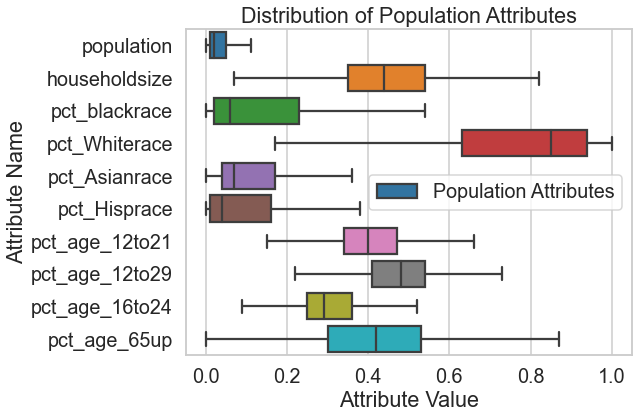

In [62]:
## visualizing the distribution of a variables

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')
sns.set_context('talk', font_scale=1.2)
plt.figure(figsize=(8, 6))
sns.boxplot(data=population_attributes, orient='h', showfliers = False)


plt.title('Distribution of Population Attributes')
plt.xlabel('Attribute Value')
plt.ylabel('Attribute Name')
plt.legend(labels=['Population Attributes'])
plt.show()

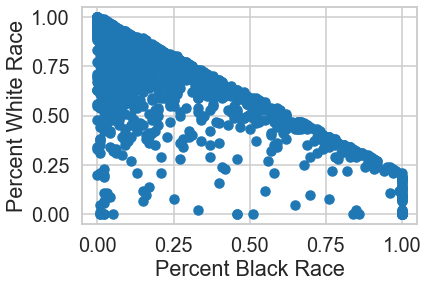

In [63]:
## visualizing the relationship between two variables [pct_blackrace] and [pct_Whiterace]

plt.scatter(population_attributes['pct_blackrace'], population_attributes['pct_Whiterace'])
plt.xlabel('Percent Black Race')
plt.ylabel('Percent White Race')
plt.show()

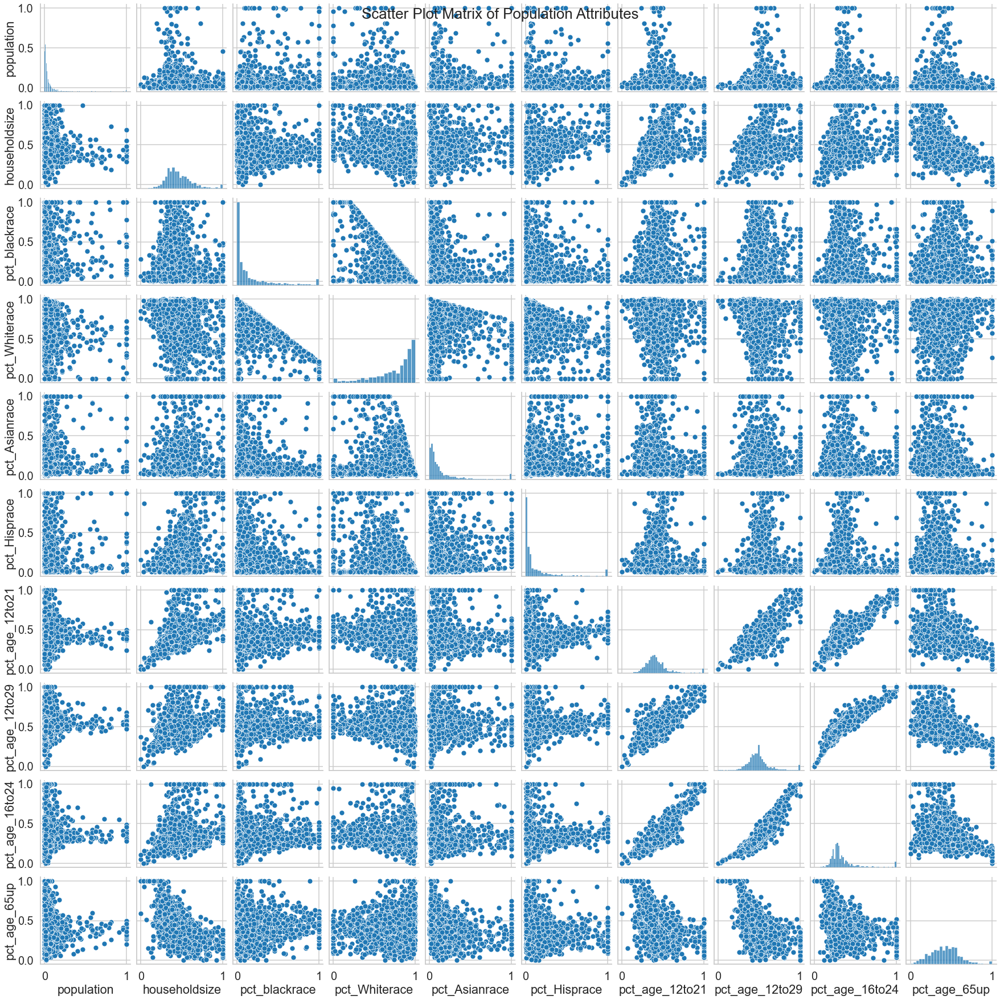

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and context for the plot
sns.set_style('whitegrid')
sns.set_context('talk', font_scale=1.2)

# Create pairplot with scatter plots
sns.pairplot(population_attributes, kind='scatter')

# Add title
plt.suptitle('Scatter Plot Matrix of Population Attributes')

# Show the plot
plt.show()

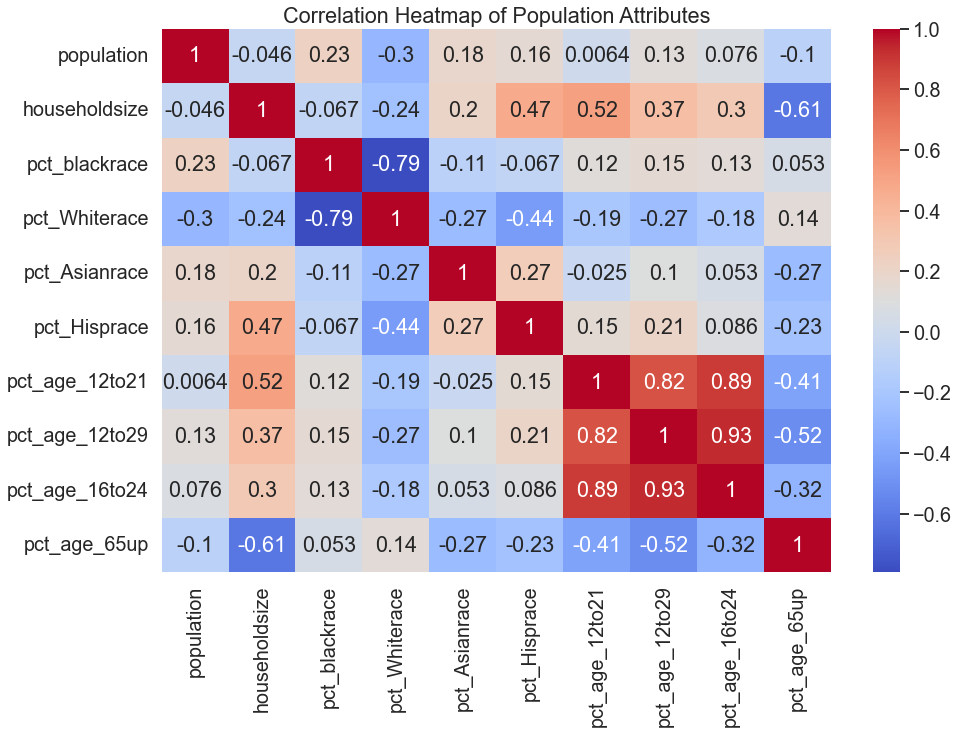

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
heatmap = sns.heatmap(population_attributes.corr(), annot=True, cmap='coolwarm')
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=90)
plt.title('Correlation Heatmap of Population Attributes')
plt.show()


## [ Second Subsample for Living Standards ]

In [66]:
## Second Subsample for Living Standards
## Dataset slicing for Living Standards

living_standard = pd.DataFrame()
living_standard[['Urban_population','median_Income']] = communities_crimes_df.iloc[:,[13,15]]
living_standard

,Urban_population,median_Income
0,0.20,0.37
1,0.02,0.31
2,0.00,0.30
3,0.06,0.58
4,0.02,0.50
...,...,...
1989,0.03,0.42
1990,0.06,0.28
1991,0.17,0.31
1992,0.09,0.44


<AxesSubplot:>

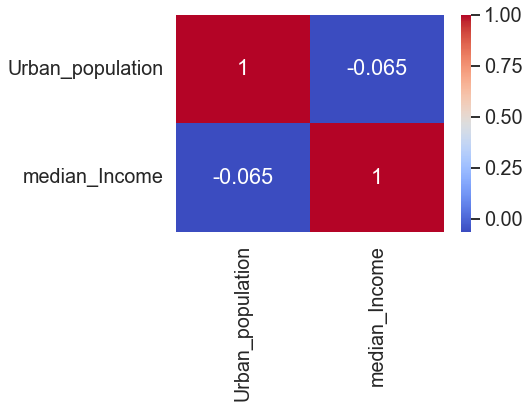

In [67]:
import seaborn as sns

sns.heatmap(living_standard.corr(), cmap='coolwarm', annot=True)

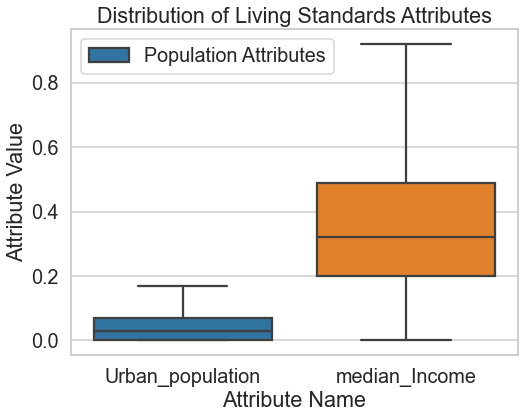

In [68]:
## visualizing the distribution of Urban_population and median_Income variables

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')
sns.set_context('talk', font_scale=1.2)
plt.figure(figsize=(8, 6))
sns.boxplot(data=living_standard, showfliers = False)



plt.title('Distribution of Living Standards Attributes')
plt.ylabel('Attribute Value')
plt.xlabel('Attribute Name')
plt.legend(labels=['Population Attributes'])
plt.show()

<Figure size 864x504 with 0 Axes>

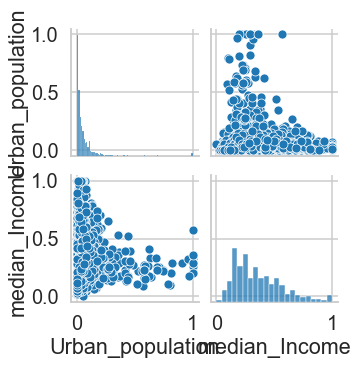

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12,7))
sns.pairplot(living_standard)

## [ Third Subsample for Income per Capita ]

In [70]:
## Third Subsample for Income per Capita
## Dataset slicing for Income per Capita

income_percapita = pd.DataFrame()
income_percapita[['perCapIncome','whitePerCap_income','blackPerCap_income','indianPerCap_income','AsianPerCap_income','OtherPerCap_income','HispPerCap_income']] = communities_crimes_df.iloc[:,23:30]
income_percapita

,perCapIncome,whitePerCap_income,blackPerCap_income,indianPerCap_income,AsianPerCap_income,OtherPerCap_income,HispPerCap_income
0,0.40,0.39,0.32,0.27,0.27,0.36,0.41
1,0.37,0.38,0.33,0.16,0.30,0.22,0.35
2,0.27,0.29,0.27,0.07,0.29,0.28,0.39
3,0.36,0.40,0.39,0.16,0.25,0.36,0.44
4,0.43,0.41,0.28,0.00,0.74,0.51,0.48
...,...,...,...,...,...,...,...
1989,0.49,0.50,0.27,0.00,0.16,0.36,0.52
1990,0.18,0.20,0.26,0.18,0.20,0.23,0.26
1991,0.31,0.34,0.25,0.19,0.28,0.22,0.28
1992,0.40,0.40,0.29,0.20,0.31,0.27,0.37


<Figure size 864x504 with 0 Axes>

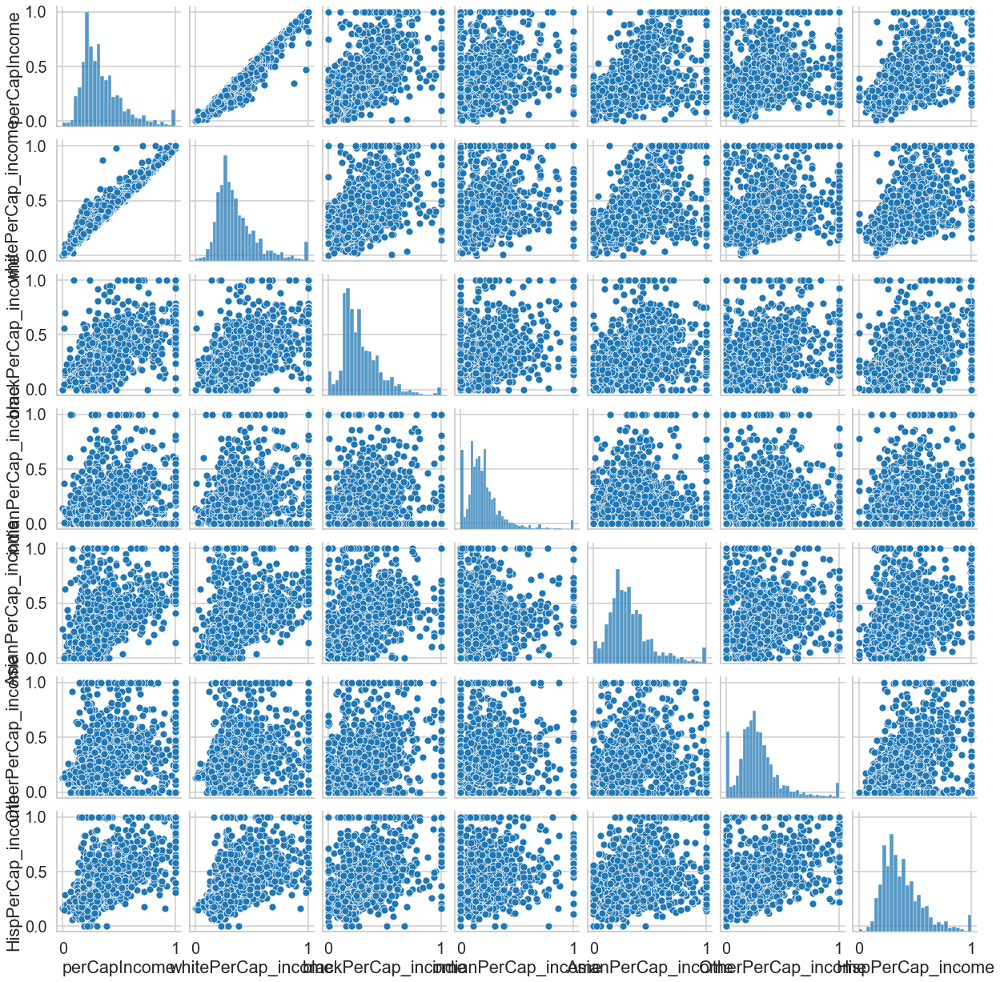

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12,7))
sns.pairplot(income_percapita)

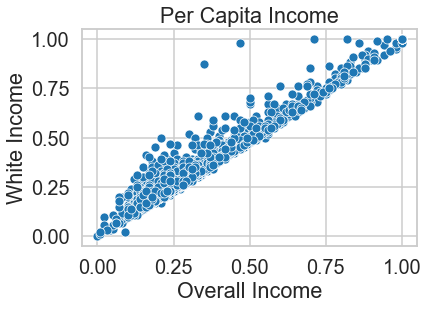

In [72]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# create a scatter plot with different colors for each ethnicity using Seaborn
sns.scatterplot(data=income_percapita, x="perCapIncome", y="whitePerCap_income", palette="viridis")

plt.title("Per Capita Income")
plt.xlabel("Overall Income")
plt.ylabel("White Income")
plt.show()


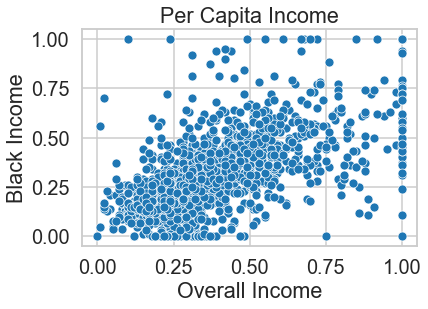

In [73]:
# create a scatter plot with different colors for each ethnicity using Seaborn
sns.scatterplot(data=income_percapita, x="perCapIncome", y="blackPerCap_income", palette="viridis")

plt.title("Per Capita Income")
plt.xlabel("Overall Income")
plt.ylabel("Black Income")
plt.show()

Text(0.5, 1.0, 'Correlation Heatmap of Living Standards Attributes')

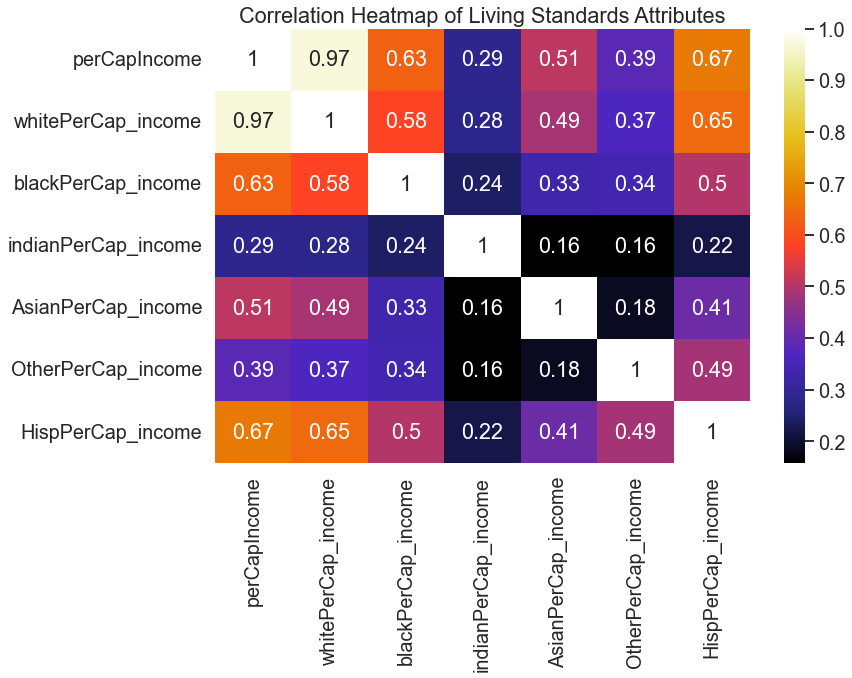

In [74]:
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(income_percapita.corr(), cmap='CMRmap', annot=True)
plt.title('Correlation Heatmap of Living Standards Attributes')

## [ Fourth Subsample on Poverty Lessons ]

In [75]:
## Fourth Subsample for poverty_edu_info
## Dataset slicing for poverty_edu_info

poverty_edu_info = pd.DataFrame()
poverty_edu_info[['Number_UnderPoverty','pct_PopUnderPoverty','pct_Less9thGrade','pct_NotHSGrad','pct_BSorMore','pct_Unemployed','pct_Employed']] = communities_crimes_df.iloc[:,31:38]
poverty_edu_info

,Number_UnderPoverty,pct_PopUnderPoverty,pct_Less9thGrade,pct_NotHSGrad,pct_BSorMore,pct_Unemployed,pct_Employed
0,0.19,0.10,0.18,0.48,0.27,0.68,0.23
1,0.24,0.14,0.24,0.30,0.27,0.73,0.57
2,0.27,0.27,0.43,0.19,0.36,0.58,0.32
3,0.10,0.09,0.25,0.31,0.33,0.71,0.36
4,0.06,0.25,0.30,0.33,0.12,0.65,0.67
...,...,...,...,...,...,...,...
1989,0.16,0.08,0.11,0.65,0.12,0.71,0.17
1990,0.32,0.33,0.37,0.22,0.24,0.77,0.10
1991,0.31,0.52,0.58,0.21,0.50,0.46,0.63
1992,0.16,0.30,0.35,0.42,0.37,0.57,0.44


<Figure size 864x504 with 0 Axes>

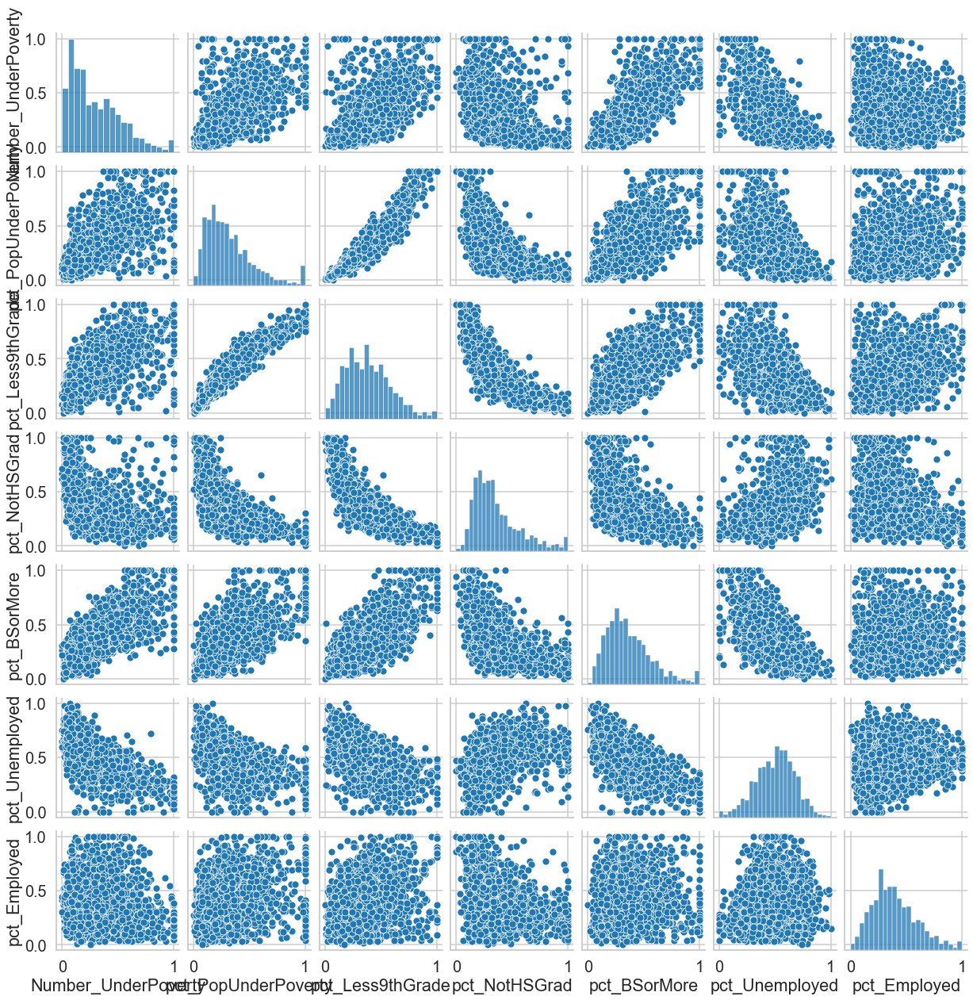

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12,7))
sns.pairplot(poverty_edu_info)

Text(0.5, 1.0, 'Correlation Heatmap of Living Standards Attributes')

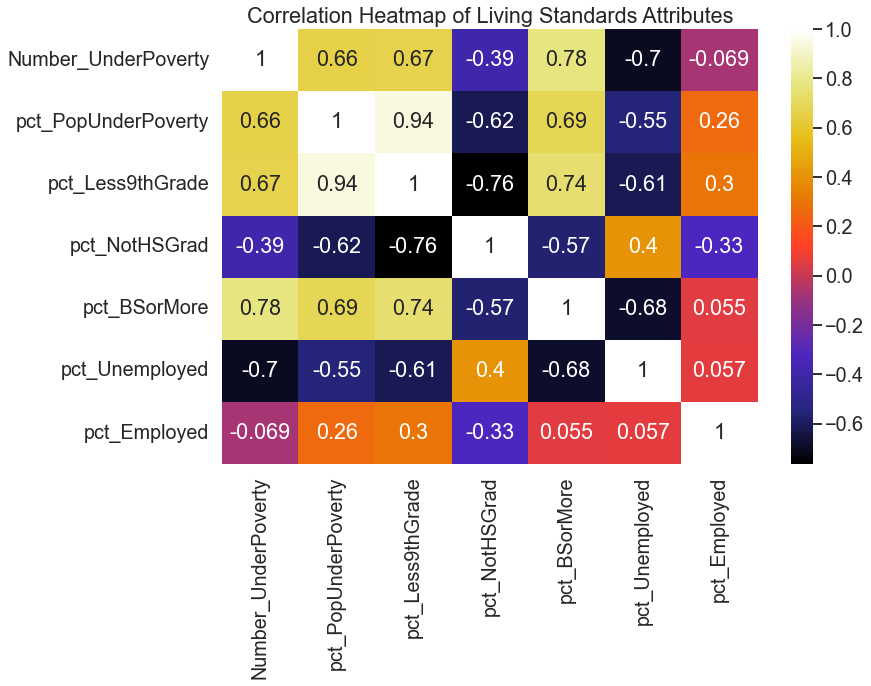

In [77]:
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(poverty_edu_info.corr(), cmap='CMRmap', annot=True)
plt.title('Correlation Heatmap of Living Standards Attributes')

### Hidden Insights is Complete now !!

### Now we are again moving to our main Dataframe for further Analysis

In [78]:
communities_crimes_df.head(20)

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,...,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop,latitude,longitude
0,CO,Lakewoodcity,1.0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,...,0.50,0.51,0.64,0.12,0.26,0.20,0.32,0.20,39.79,-105.11
1,WA,Tukwilacity,1.0,0.00,0.16,0.12,0.74,0.45,0.07,0.26,...,0.34,0.60,0.52,0.02,0.12,0.45,0.00,0.67,47.30,-122.26
2,MD,Aberdeentown,1.0,0.00,0.42,0.49,0.56,0.17,0.04,0.39,...,0.54,0.67,0.56,0.01,0.21,0.02,0.00,0.43,38.64,-76.90
3,NJ,Willingborotownship,1.0,0.04,0.77,1.00,0.08,0.12,0.10,0.51,...,0.73,0.64,0.65,0.02,0.39,0.28,0.00,0.12,40.58,-74.27
4,PA,Bethlehemtownship,1.0,0.01,0.55,0.02,0.95,0.09,0.05,0.38,...,0.64,0.61,0.53,0.04,0.09,0.02,0.00,0.03,40.61,-80.25
5,CA,SouthPasadenacity,1.0,0.02,0.28,0.06,0.54,1.00,0.25,0.31,...,0.49,0.73,0.64,0.01,0.58,0.10,0.00,0.14,33.97,-118.24
6,RI,Lincolntown,1.0,0.01,0.39,0.00,0.98,0.06,0.02,0.30,...,0.77,0.91,0.84,0.05,0.08,0.06,0.00,0.03,41.42,-71.78
7,CA,Selmacity,1.0,0.01,0.74,0.03,0.46,0.20,1.00,0.52,...,0.52,0.79,0.78,0.01,0.33,0.00,0.00,0.55,33.97,-118.24
8,KY,Hendersoncity,1.0,0.03,0.34,0.20,0.84,0.02,0.00,0.38,...,0.48,0.79,0.75,0.04,0.17,0.04,0.00,0.53,38.26,-85.05
9,MO,Claytoncity,1.0,0.01,0.40,0.06,0.87,0.30,0.03,0.90,...,0.34,0.23,0.09,0.00,0.47,0.11,0.00,0.15,38.65,-90.58


In [79]:
#!pip install folium

In [80]:
import folium
import pandas as pd


# Create a map centered at the mean of the latitude and longitude data
m = folium.Map(location=[communities_crimes_df['latitude'].mean(), communities_crimes_df['longitude'].mean()], zoom_start=3)

# Add markers for each location
for index, row in communities_crimes_df.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']], tooltip=row['state']).add_to(m)

# Display the map
m


In [81]:
import plotly.express as px


fig = px.choropleth(communities_crimes_df, locations="state", color="population",
                    hover_name = 'state',
                    color_continuous_scale='reds',
                    title="Chloropleth Map Example")

fig.show()

In [82]:
import folium
import pandas as pd


# Create a map centered at the geographic center of the contiguous United States
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# Add markers to the map based on the latitudes and longitudes in your dataset
for index, row in communities_crimes_df.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    name = row['ViolentCrimesPerPop']
    marker = folium.Marker([lat, lon], popup=name)
    marker.add_to(m)

# Display the map
m

In [83]:
import plotly.express as px
import pandas as pd



# Create a scatter mapbox plot using plotly express
fig = px.scatter_mapbox(communities_crimes_df, lat="latitude", lon="longitude", hover_name="ViolentCrimesPerPop", zoom=3)

# Update the mapbox style to show a map of the United States
fig.update_layout(mapbox_style="open-street-map", mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})

# Show the map
fig.show()


In [84]:
import plotly.express as px
import matplotlib.pyplot as plt

fig = px.imshow(communities_crimes_df.corr(),
                labels=dict(x="Columns", y="Columns", color="Correlation"),
                color_continuous_scale='ice')

fig.update_layout(
    title={
        'text': "Correlation Heatmap of Crime & Community Data",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    width=16*60,
    height=12*60
)

fig.show()

### Dealing with Large number of attributes is Quite Challenging, Hence we are Using -->

### [ Data Preprocessing & Dimension Reduction Techniques ]

In [85]:
## Here, we are creating a relevant dataframe to hold the data that will be used for Standardized and Principal Component Analysis (PCA).
prec_df = communities_crimes_df.drop(columns=['state','communityname',
                          'fold', 'latitude', 'longitude', 'ViolentCrimesPerPop'], axis=1)
prec_df.head()

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.0,0.12,0.42,0.50,0.51,0.64,0.12,0.26,0.20,0.32
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.0,0.21,0.50,0.34,0.60,0.52,0.02,0.12,0.45,0.00
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.0,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.00
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.0,0.19,0.30,0.73,0.64,0.65,0.02,0.39,0.28,0.00
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.0,0.11,0.72,0.64,0.61,0.53,0.04,0.09,0.02,0.00


In [86]:
## Making the Target Variable Separate
Y = pd.DataFrame()
Y['ViolentCrimesPerPop'] = communities_crimes_df['ViolentCrimesPerPop']
Y['ViolentCrimesPerPop']

0       0.20
1       0.67
2       0.43
3       0.12
4       0.03
        ... 
1989    0.09
1990    0.45
1991    0.23
1992    0.19
1993    0.48
Name: ViolentCrimesPerPop, Length: 1994, dtype: float64

In [87]:
## Performing scaling on our input dataset

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_scale = sc.fit_transform(prec_df)

#standardization data after performing standardization
standardized_final_data=pd.DataFrame(data=X_scale, columns = prec_df.columns)
standardized_final_data

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn
0,1.043612,-0.814997,-0.630002,0.599578,-0.161288,0.111765,-0.542791,-0.166286,-0.277923,-0.575886,...,-0.226932,-0.413507,-0.924683,-0.193320,-0.580753,-0.058180,0.500488,0.133699,0.167316,0.940399
1,-0.453937,-1.853636,-0.235335,-0.056219,1.418982,-0.318466,-1.058398,0.669791,0.082518,-0.854996,...,-0.226932,-0.024025,-0.533058,-1.075804,-0.131811,-0.663716,-0.413323,-0.555817,1.259032,-0.391447
2,-0.453937,-0.265129,1.224931,-0.793990,0.078147,-0.447535,-0.220536,-0.166286,-0.337996,-0.575886,...,-0.226932,-0.326956,-0.582011,0.027301,0.217367,-0.461871,-0.504705,-0.112556,-0.618719,-0.391447
3,-0.138663,1.873246,3.237730,-2.761379,-0.161288,-0.189397,0.552875,0.042733,0.022445,-1.189929,...,-0.226932,-0.110577,-1.512119,1.075250,0.067719,-0.007719,-0.413323,0.773964,0.516665,-0.391447
4,-0.375118,0.529125,-0.630002,0.804514,-0.304949,-0.404512,-0.284987,-0.793343,-0.638364,-0.352597,...,-0.226932,-0.456783,0.543909,0.578853,-0.081928,-0.613255,-0.230561,-0.703570,-0.618719,-0.391447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,-0.375118,-0.387322,-0.314269,0.476616,-0.161288,0.068742,0.037268,0.112406,0.082518,-0.687530,...,-0.226932,0.019251,-1.610026,-1.075804,-0.730401,-1.319714,-0.504705,0.232202,-0.487713,-0.391447
1990,-0.059845,3.034078,1.106531,-1.941633,3.238686,0.757111,1.712992,2.550963,2.365311,-1.580683,...,-0.226932,1.360799,-1.756885,-2.013442,-2.625936,-3.287706,-0.413323,0.675462,0.167316,-0.391447
1991,0.807157,-0.570611,0.277731,-0.261155,-0.544384,0.455950,-0.478340,0.042733,-0.157776,0.652200,...,-0.027680,0.149078,0.348097,0.413388,0.815957,0.547356,0.134964,0.429206,0.079979,3.395990
1992,0.176610,0.284739,-0.472135,0.476616,0.317581,-0.189397,1.004032,1.714887,1.764576,-0.073487,...,-0.127306,1.014593,0.152285,0.027301,-0.181693,-0.663716,-0.321942,0.724713,0.735008,0.524197


In [88]:
## Computing the Desired principal components in order to perform prinicipal component analysis

# Computing the covariance matrix
covariance_matrix = np.cov(X_scale.T)

# Compute the eigenvalues and eigenvectors of the covariance matrix
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Selecting the number of principal components to retain
total_variance = sum(eigenvalues)
variance_explained = [(i / total_variance) for i in sorted(eigenvalues, reverse=True)]
cumulative_variance_explained = np.cumsum(variance_explained)
num_components = np.argmax(cumulative_variance_explained >= 0.84) + 1

print(num_components)

15


## 5) Dimension Reduction

In [89]:
import numpy as np
from sklearn.decomposition import PCA

## Compute the principal component analysis
pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(standardized_final_data)

print("Amount of variance: %s" % pca.explained_variance_)
print('\n')
print("Sum of the variance: %s" % sum(pca.explained_variance_).round(2))
print('\n')
print("Percentage of variance: %s" % pca.explained_variance_ratio_)
print('\n')
print("Sum of the percentage of variance: %s" % sum(pca.explained_variance_ratio_).round(2))

Amount of variance: [25.18937037 16.8306067   9.3006685   7.55458725  5.63632545  4.20460169
  3.24094805  2.93187033  2.06937345  1.57944278  1.51739009  1.44282518
  1.36200537  1.02881648  0.95705208]


Sum of the variance: 84.85


Percentage of variance: [0.25176738 0.16822166 0.09296004 0.07550799 0.05633499 0.04202493
 0.03239323 0.029304   0.02068336 0.01578651 0.01516629 0.01442102
 0.01361322 0.01028301 0.00956572]


Sum of the percentage of variance: 0.85


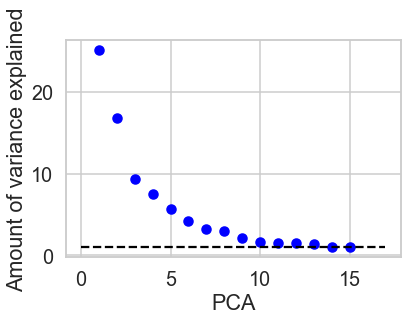

(1994, 15)


In [90]:
## Explaining the amount of variance captured by each component using visualization

plt.scatter(np.arange(1,(16)),pca.explained_variance_, c = 'blue')
plt.plot((0,17), (1,1), color = 'black', linestyle = 'dashed')
plt.xlabel('PCA')
plt.ylabel('Amount of variance explained')
plt.show()
print(X_pca.shape)

In [91]:
## After performing Principal Component Analysis (PCA), we are now converting the resulting data into a dataframe for further analysis 

PCA_df = pd.DataFrame(data=X_pca, columns = ['PCA_1', 'PCA_2', 'PCA_3', 
                                            'PCA_4', 'PCA_5', 'PCA_6', 'PCA_7', 'PCA_8', 'PCA_9', 'PCA_10', 'PCA_11', 'PCA_12', 'PCA_13', 'PCA_14', 'PCA_15'])
PCA_df

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15
0,-1.351520,-1.025619,3.263717,0.908789,1.506314,-3.099570,-0.215105,0.170823,0.519856,-0.167373,0.672269,1.390510,-0.765869,-0.943307,0.533473
1,1.427655,0.512987,4.296704,2.068268,-2.515624,-4.664026,-2.136739,1.388123,-0.791730,-2.007538,2.055036,-0.932993,-0.012505,-0.833754,-0.067095
2,2.123212,-2.425183,-0.241726,-0.325387,-0.184349,-2.338119,-1.915935,-1.212344,1.690192,-0.704535,0.359082,1.745317,0.889196,1.263535,-1.427771
3,-3.009952,1.971122,-3.538188,-0.446266,3.199043,-0.183520,-4.207292,-2.764106,2.376813,-0.768256,-4.689357,2.141253,-0.906648,0.087282,-1.652257
4,-5.620855,-2.700276,-2.767430,-0.449683,1.771407,-0.527008,0.609156,0.668602,0.194791,-0.632853,-0.369639,-0.138549,0.161028,2.452579,0.063623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,-3.302889,0.073605,2.571217,3.196598,-0.530566,-1.519941,0.047640,-0.322208,0.726368,-0.200647,-0.599494,1.535420,-1.485484,0.361124,-0.405726
1990,2.150588,9.158843,-1.130128,5.271977,-1.316807,-0.719398,0.125053,-0.540409,2.829952,-1.978289,-1.180260,-0.401397,-0.242468,1.155690,-1.218045
1991,3.276748,0.169066,0.993020,-3.536530,0.375523,0.277115,-0.615647,0.549443,1.879227,0.043479,0.834918,-0.654344,0.179093,0.225861,1.121415
1992,-1.703341,3.418051,1.570523,1.311845,-1.545171,2.121929,-0.756774,2.912077,1.929440,0.629950,0.256505,-0.135035,0.445715,0.214014,0.498286


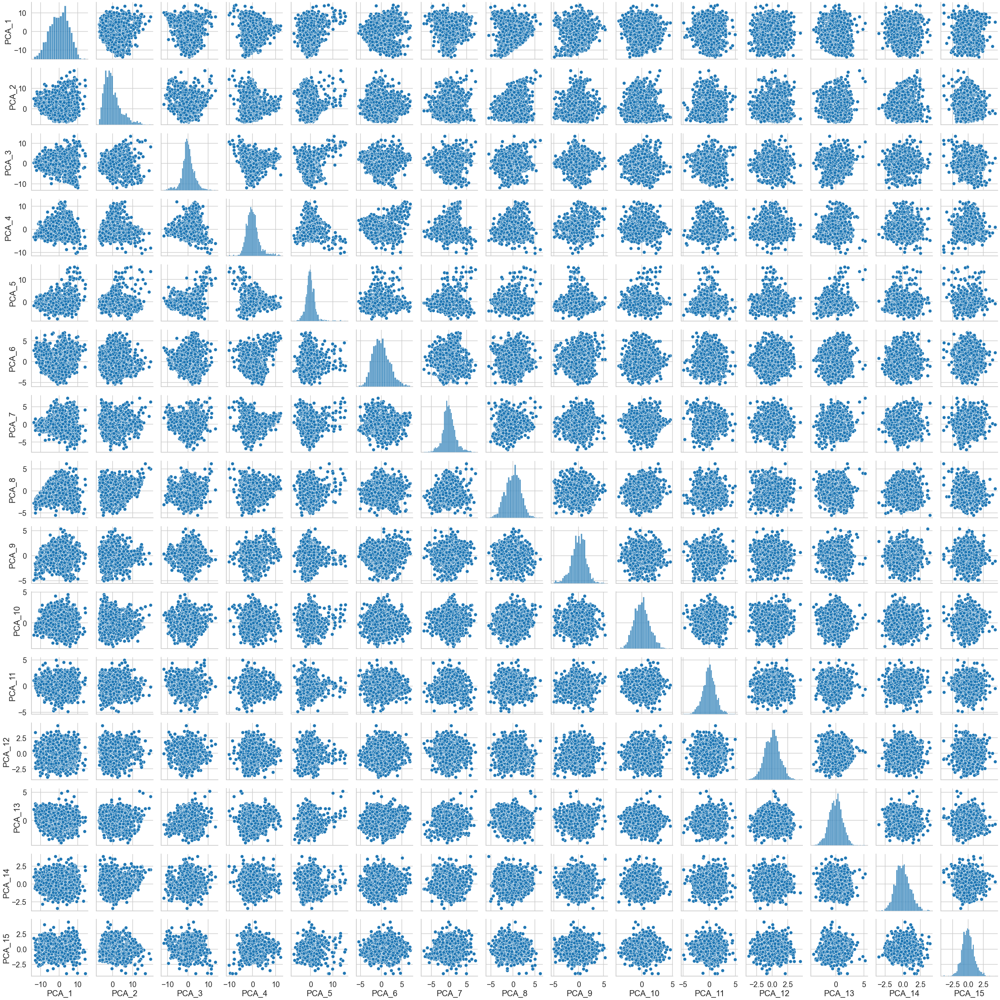

In [92]:
#creating a scatter plot matrix on our Principal component analysis dataset to examine the pairwise relationship between variables

import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(PCA_df)

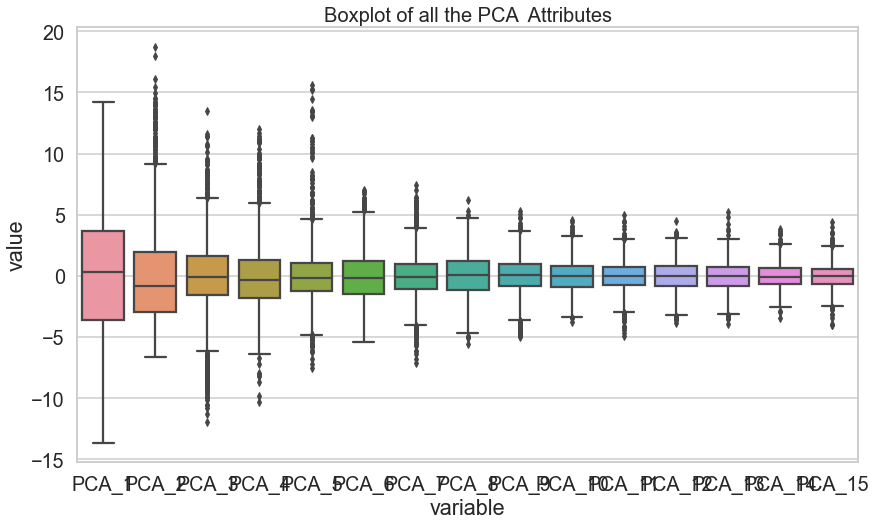

In [93]:
## creating a boxplot for each attribute

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 8))
ax = sns.boxplot(x="variable", y="value", data=pd.melt(PCA_df))
ax.set_title('Boxplot of all the PCA  Attributes', fontsize=20)
sns.set(font_scale=1.2)


plt.show()


In [94]:
model_data = PCA_df.copy()
model_data['ViolentCrimesPerPop'] = Y['ViolentCrimesPerPop']

In [95]:
model_data

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,ViolentCrimesPerPop
0,-1.351520,-1.025619,3.263717,0.908789,1.506314,-3.099570,-0.215105,0.170823,0.519856,-0.167373,0.672269,1.390510,-0.765869,-0.943307,0.533473,0.20
1,1.427655,0.512987,4.296704,2.068268,-2.515624,-4.664026,-2.136739,1.388123,-0.791730,-2.007538,2.055036,-0.932993,-0.012505,-0.833754,-0.067095,0.67
2,2.123212,-2.425183,-0.241726,-0.325387,-0.184349,-2.338119,-1.915935,-1.212344,1.690192,-0.704535,0.359082,1.745317,0.889196,1.263535,-1.427771,0.43
3,-3.009952,1.971122,-3.538188,-0.446266,3.199043,-0.183520,-4.207292,-2.764106,2.376813,-0.768256,-4.689357,2.141253,-0.906648,0.087282,-1.652257,0.12
4,-5.620855,-2.700276,-2.767430,-0.449683,1.771407,-0.527008,0.609156,0.668602,0.194791,-0.632853,-0.369639,-0.138549,0.161028,2.452579,0.063623,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,-3.302889,0.073605,2.571217,3.196598,-0.530566,-1.519941,0.047640,-0.322208,0.726368,-0.200647,-0.599494,1.535420,-1.485484,0.361124,-0.405726,0.09
1990,2.150588,9.158843,-1.130128,5.271977,-1.316807,-0.719398,0.125053,-0.540409,2.829952,-1.978289,-1.180260,-0.401397,-0.242468,1.155690,-1.218045,0.45
1991,3.276748,0.169066,0.993020,-3.536530,0.375523,0.277115,-0.615647,0.549443,1.879227,0.043479,0.834918,-0.654344,0.179093,0.225861,1.121415,0.23
1992,-1.703341,3.418051,1.570523,1.311845,-1.545171,2.121929,-0.756774,2.912077,1.929440,0.629950,0.256505,-0.135035,0.445715,0.214014,0.498286,0.19


In [103]:
##Train test split
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your dataset
#dataset = pd.read_csv("my_dataset.csv")


# Shuffle the dataset
shuffled_dataset = model_data.sample(frac=1, random_state=42)

# Split the dataset into training, validation, and testing sets
train_data, test_data = train_test_split(shuffled_dataset, test_size=0.2, random_state=42)
#train_data, validation_data = train_test_split(train_data, test_size=0.25, random_state=42)


print(train_data.shape)
print(test_data.shape)
print(validation_data.shape)

(1595, 16)
(399, 16)
(399, 16)


In [97]:
train_X, train_y = train_data.drop("ViolentCrimesPerPop", axis=1), train_data["ViolentCrimesPerPop"]
validation_X, validation_y = validation_data.drop("ViolentCrimesPerPop", axis=1), validation_data["ViolentCrimesPerPop"]
test_X, test_y = test_data.drop("ViolentCrimesPerPop", axis=1), test_data["ViolentCrimesPerPop"]

print(str(train_X.shape) + " - " + str(train_y.shape))
print(str(validation_X.shape) + " - " + str(validation_y.shape))
print(str(test_X.shape) + " - " + str(test_y.shape))

(1196, 15) - (1196,)
(399, 15) - (399,)
(399, 15) - (399,)


In [98]:
## Linear Regression

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Instantiate the linear regression model
lr = LinearRegression()

# Fit the model to the training data
lr.fit(train_X, train_y)

# Make predictions on the validation set
y_pred_lr = lr.predict(validation_X)

# Calculate the mean squared error on the validation set
mse_val_lr = mean_squared_error(validation_y, y_pred_lr)

# Print the mean squared error
print("Mean Squared Error on validation set: ", mse_val_lr)

# Make predictions on the test set
y_pred_test_lr = lr.predict(test_X)

# Calculate the mean squared error on the test set
mse_test_lr = mean_squared_error(test_y, y_pred_test_lr)

# Print the mean squared error on the test set
print("Mean Squared Error on test set: ", mse_test_lr)

Mean Squared Error on validation set:  0.02119348004467121
Mean Squared Error on test set:  0.01824875321830249


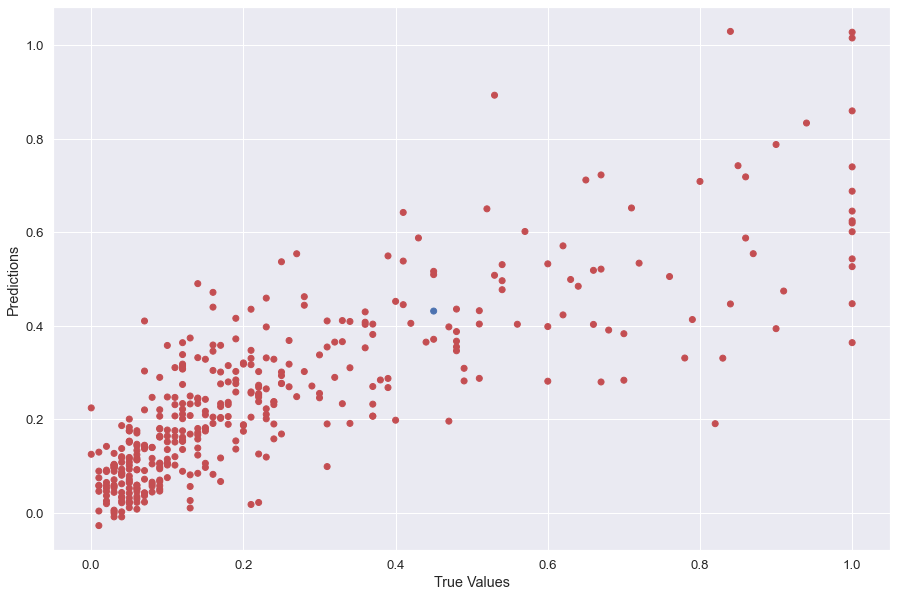

In [99]:
import matplotlib.pyplot as plt
colors = ['b' if val == 0 else 'r' for val in range(len(validation_y))]
plt.figure(figsize=(15, 10))
plt.scatter(validation_y, y_pred_lr, c=colors)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

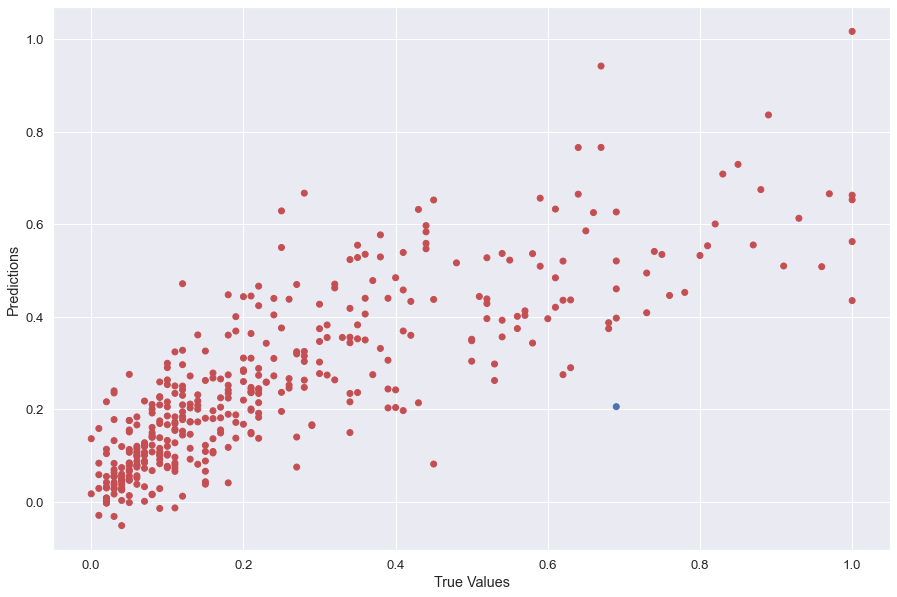

In [100]:
colors = ['b' if val == 0 else 'r' for val in range(len(test_y))]
plt.figure(figsize=(15, 10))
plt.scatter(test_y, y_pred_test_lr, c=colors)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

LinearRegression validation set:
Mean squared error: 0.02
R^2 score: 0.66
-----------------------------------------------------------
LinearRegression test set:
Mean squared error: 0.02
R^2 score: 0.66

***********************************************************
Ridge validation set:
Mean squared error: 0.02
R^2 score: 0.66
-----------------------------------------------------------
Ridge test set:
Mean squared error: 0.02
R^2 score: 0.66

***********************************************************
Lasso validation set:
Mean squared error: 0.03
R^2 score: 0.47
-----------------------------------------------------------
Lasso test set:
Mean squared error: 0.03
R^2 score: 0.49

***********************************************************
ElasticNet validation set:
Mean squared error: 0.03
R^2 score: 0.57
-----------------------------------------------------------
ElasticNet test set:
Mean squared error: 0.02
R^2 score: 0.58

***********************************************************
Deci

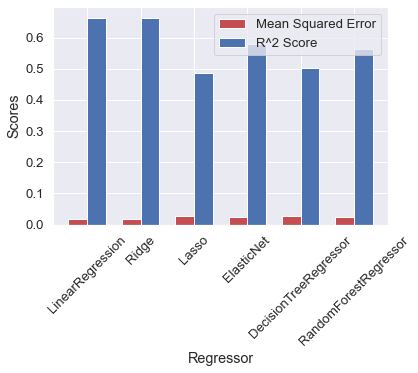

In [101]:
## All regressors

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into training, validation, and test sets
#train_X, train_y = X[:300], y[:300]
#validation_X, validation_y = X[300:350], y[300:350]
#test_X, test_y = X[350:], y[350:]

# Define a list of regressors to use
regressors = [
    LinearRegression(),
    Ridge(alpha=0.5),
    Lasso(alpha=0.1),
    ElasticNet(alpha=0.1, l1_ratio=0.5),
    DecisionTreeRegressor(max_depth=3),
    RandomForestRegressor(n_estimators=100, max_depth=3)
]

mse_scores = []
r2_scores = []
names = []

# Train each regressor on the training set, and evaluate its performance on the validation and test sets
for regressor in regressors:
    # Fit the regressor to the training data
    regressor.fit(train_X, train_y)
    
    # Make predictions on the validation and test sets
    validation_y_pred = regressor.predict(validation_X)
    test_y_pred = regressor.predict(test_X)
    
    # Calculate the mean squared error and R^2 score on the validation set
    mse = mean_squared_error(validation_y, validation_y_pred)
    r2 = r2_score(validation_y, validation_y_pred)
    print(f'{type(regressor).__name__} validation set:\nMean squared error: {mse:.2f}\nR^2 score: {r2:.2f}')
    
    print("-----------------------------------------------------------")
    
    # Calculate the mean squared error and R^2 score on the test set
    mse = mean_squared_error(test_y, test_y_pred)
    r2 = r2_score(test_y, test_y_pred)
    print(f'{type(regressor).__name__} test set:\nMean squared error: {mse:.2f}\nR^2 score: {r2:.2f}\n')
    
    print("***********************************************************")
    
    mse_scores.append(mse)
    r2_scores.append(r2)
    names.append(type(regressor).__name__)

ind = np.arange(len(regressors))
width = 0.35
fig, ax = plt.subplots()
mse_bars = ax.bar(ind, mse_scores, width, color='r')
r2_bars = ax.bar(ind + width, r2_scores, width, color='b')
ax.set_xlabel('Regressor')
ax.set_ylabel('Scores')
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(names, rotation=45)
ax.legend((mse_bars[0], r2_bars[0]), ('Mean Squared Error', 'R^2 Score'))
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LogisticRegression

# load data and split into X and y
X = clf_model_data.drop('ViolentCrimesPerPop', axis=1)
y = clf_model_data['ViolentCrimesPerPop']

# Split the data into training and testing sets
#train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)

# define the model
model = LogisticRegression()

# define cross-validation folds
folds = [3, 5, 10]

# evaluate the model with different folds
for fold in folds:
    kfold = KFold(n_splits=fold, shuffle=True, random_state=42)
    scores = cross_val_score(model, X, y, cv=kfold, scoring='accuracy')
    print('Fold:', fold, 'Accuracy:', scores.mean())

In [102]:
## Trying classification
clf_model_data = PCA_df.copy()
clf_model_data['ViolentCrimesPerPop'] = Y['ViolentCrimesPerPop']

In [86]:
clf_model_data['ViolentCrimesPerPop'].describe()

count    1994.000000
mean        0.237979
std         0.232985
min         0.000000
25%         0.070000
50%         0.150000
75%         0.330000
max         1.000000
Name: ViolentCrimesPerPop, dtype: float64

In [87]:
# Calculate the mean of the score variable
mean_score = clf_model_data['ViolentCrimesPerPop'].mean()

# Define a function to map scores to categories
def map_scores(x):
    if x >= mean_score:
        return 1
    else:
        return 0

# Use the apply() function to map the scores to categories
clf_model_data['ViolentCrimesPerPop'] = clf_model_data['ViolentCrimesPerPop'].apply(map_scores)

# Display the DataFrame
print(clf_model_data)

         PCA_1      PCA_2     PCA_3     PCA_4     PCA_5     PCA_6     PCA_7  \
0    -1.351520  -1.025619  3.263709  0.908786  1.506295 -3.099628 -0.215231   
1     1.427654   0.512984  4.296700  2.068296 -2.515558 -4.663711 -2.136572   
2     2.123212  -2.425185 -0.241733 -0.325379 -0.184311 -2.337807 -1.916399   
3    -3.009952   1.971124 -3.538190 -0.446330  3.198995 -0.183739 -4.207495   
4    -5.620855  -2.700276 -2.767427 -0.449695  1.771405 -0.526973  0.609254   
...        ...        ...       ...       ...       ...       ...       ...   
1989 -3.302889   0.073603  2.571218  3.196653 -0.530546 -1.519782  0.047978   
1990  2.150588   9.158841 -1.130130  5.271997 -1.316778 -0.719060  0.124654   
1991  3.276749   0.169069  0.993020 -3.536601  0.375407  0.276736 -0.616494   
1992 -1.703341   3.418051  1.570523  1.311838 -1.545180  2.121898 -0.757001   
1993  3.295257  10.170112 -3.768466  0.409017  1.559695 -2.485621  0.772106   

         PCA_8     PCA_9    PCA_10    PCA_11    PCA

In [88]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Split the dataset into features (X) and target variable (y)
X = clf_model_data.drop('ViolentCrimesPerPop', axis=1)
y = clf_model_data['ViolentCrimesPerPop']

# Split the data into training and testing sets
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)


# Train a logistic regression model on the training data
logreg = LogisticRegression()
logreg.fit(train_X, train_y)

# Make predictions on the testing set using the logistic regression model
test_y_pred = logreg.predict(test_X)

# Evaluate the performance of the logistic regression model using accuracy score
accuracy = accuracy_score(test_y, test_y_pred)
print("Accuracy on testing data: {:.2f}".format(accuracy))

Accuracy on testing data: 0.85


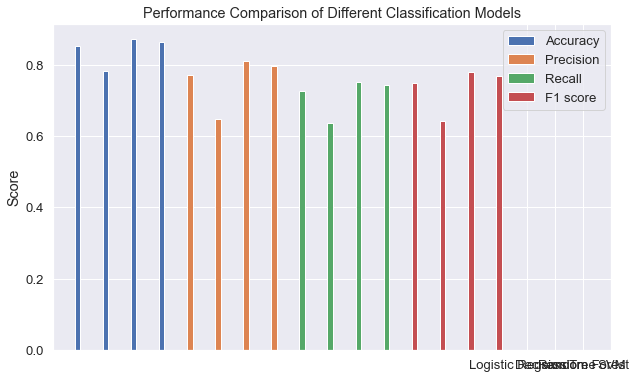

In [93]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Split the dataset into features (X) and target variable (y)
X = clf_model_data.drop('ViolentCrimesPerPop', axis=1)
y = clf_model_data['ViolentCrimesPerPop']

# Split the data into training and testing sets
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)

# Train different classification models on the training data
logreg = LogisticRegression()
logreg.fit(train_X, train_y)

tree = DecisionTreeClassifier()
tree.fit(train_X, train_y)

forest = RandomForestClassifier()
forest.fit(train_X, train_y)

svm = SVC()
svm.fit(train_X, train_y)

# Evaluate the performance of each model on the testing data
models = {'Logistic Regression': logreg,
          'Decision Tree': tree,
          'Random Forest': forest,
          'SVM': svm}

accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for name, model in models.items():
    y_pred = model.predict(test_X)
    accuracy_scores.append(accuracy_score(test_y, y_pred))
    precision_scores.append(precision_score(test_y, y_pred))
    recall_scores.append(recall_score(test_y, y_pred))
    f1_scores.append(f1_score(test_y, y_pred))

# Create a bar plot to compare the performance of each model
fig, ax = plt.subplots(figsize=(10, 6))

x = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM']
width = 0.2

ax.bar(x, accuracy_scores, width, label='Accuracy')
ax.bar([str(i) + str(width) for i in x], precision_scores, width, label='Precision')
ax.bar([str(i) + str(2*width) for i in x], recall_scores, width, label='Recall')
ax.bar([str(i) + str(3*width) for i in x], f1_scores, width, label='F1 score')

ax.set_ylabel('Score')
ax.set_title('Performance Comparison of Different Classification Models')
ax.set_xticks([str(i) + str(1.5*width) for i in range(len(x))])
ax.set_xticklabels(x)
ax.legend()

plt.show()

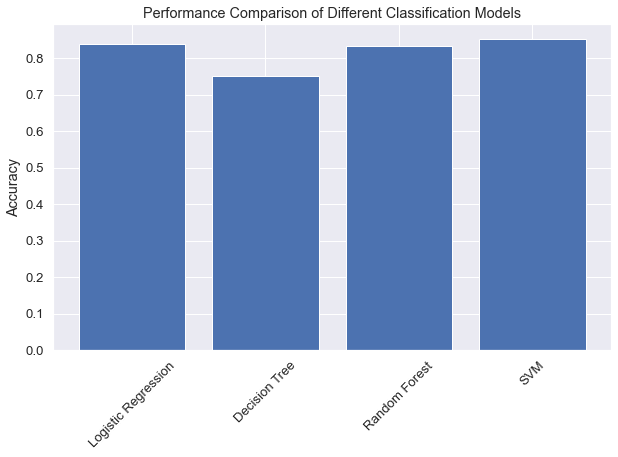

In [96]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

# Load the dataset into a pandas dataframe
#data = pd.read_csv('path/to/your/dataset.csv')

# Split the dataset into features (X) and target variable (y)
X = clf_model_data.drop('ViolentCrimesPerPop', axis=1)
y = clf_model_data['ViolentCrimesPerPop']

# Split the data into training and testing sets
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data by scaling the features
# scaler = StandardScaler()
# train_X = scaler.fit_transform(train_X)
# test_X = scaler.transform(test_X)

# Define the classification models to evaluate
models = [('Logistic Regression', LogisticRegression()),
          ('Decision Tree', DecisionTreeClassifier()),
          ('Random Forest', RandomForestClassifier()),
          ('SVM', SVC())]

# Evaluate each model using cross-validation and store the results in a dataframe
results = pd.DataFrame(columns=['Model', 'Accuracy'])

for name, model in models:
    scores = cross_val_score(model, train_X, train_y, cv=10)
    accuracy = scores.mean()
    results = results.append({'Model': name, 'Accuracy': accuracy}, ignore_index=True)

# Create a bar plot to compare the performance of each model
fig, ax = plt.subplots(figsize=(10, 6))

x = results['Model']
y = results['Accuracy']

ax.bar(x, y)

ax.set_ylabel('Accuracy')
ax.set_title('Performance Comparison of Different Classification Models')
ax.set_xticklabels(x, rotation=45)

plt.show()

In [101]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.svm import SVC

# load data and split into X and y
X = clf_model_data.drop('ViolentCrimesPerPop', axis=1)
y = clf_model_data['ViolentCrimesPerPop']

# Split the data into training and testing sets
#train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)

# define the model
model = SVC()

# define cross-validation folds
folds = [3, 5, 10]

# evaluate the model with different folds
for fold in folds:
    kfold = KFold(n_splits=fold, shuffle=True, random_state=42)
    scores = cross_val_score(model, X, y, cv=kfold, scoring='accuracy')
    print('Fold:', fold, 'Accuracy:', scores.mean())

Fold: 3 Accuracy: 0.8570666123139173
Fold: 5 Accuracy: 0.8540522159670534
Fold: 10 Accuracy: 0.8620603015075377


In [102]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LogisticRegression

# load data and split into X and y
X = clf_model_data.drop('ViolentCrimesPerPop', axis=1)
y = clf_model_data['ViolentCrimesPerPop']

# Split the data into training and testing sets
#train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=42)

# define the model
model = LogisticRegression()

# define cross-validation folds
folds = [3, 5, 10]

# evaluate the model with different folds
for fold in folds:
    kfold = KFold(n_splits=fold, shuffle=True, random_state=42)
    scores = cross_val_score(model, X, y, cv=kfold, scoring='accuracy')
    print('Fold:', fold, 'Accuracy:', scores.mean())

Fold: 3 Accuracy: 0.8410197179696229
Fold: 5 Accuracy: 0.8440233750204656
Fold: 10 Accuracy: 0.8440150753768846
